## 1. Import and Install

In [1]:
#!pip install tensorflow==2.4.1 tensorflow-gpu==2.4.1 opencv-python mediapipe sklearn matplotlib

In [9]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
import time
import mediapipe as mp

# 2. Keypoints using MP Holistic 

<img src="hand.jpeg" width="350"/>

# Landmarks 

![hand_3.jpeg](hand_3.jpeg) 

> set up media pipe holistic model & media pipe drawing utilities

> Media Pipe can be used to find keypoints from the hands and posture. It will be usefull in order to extract information from the videos.

In [11]:
mp_holistic = mp.solutions.holistic # Holistic model
mp_drawing = mp.solutions.drawing_utils # Drawing utilities

In [12]:
def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
    image.flags.writeable = False                  # Image is no longer writeable
    results = model.process(image)                 # Make prediction
    image.flags.writeable = True                   # Image is now writeable 
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
    return image, results

In [13]:
def draw_landmarks(image, results):
    
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw right hand connections
   # mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw left hand connections

In [14]:
def draw_styled_landmarks(image, results):
   
    # Draw right hand connections  
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                             ) 
    
    # Draw left hand connections
    
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(121,22,76), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(121,44,250), thickness=2, circle_radius=2)

                            )

> Built a loop to extract the values

In [15]:
cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():

        # Read feed
        ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
    #    print(results)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)

        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows()

In [9]:
cap.release()
cv2.destroyAllWindows()

> Printing each of the individual values for one landmark

In [16]:
results.right_hand_landmarks

landmark {
  x: 0.2938727
  y: 0.68127376
  z: 4.81925e-07
}
landmark {
  x: 0.37764987
  y: 0.64790434
  z: -0.025255386
}
landmark {
  x: 0.44256186
  y: 0.57040966
  z: -0.031172995
}
landmark {
  x: 0.48439693
  y: 0.49448052
  z: -0.03634308
}
landmark {
  x: 0.51983905
  y: 0.44407108
  z: -0.041817974
}
landmark {
  x: 0.401786
  y: 0.44100899
  z: -0.008235018
}
landmark {
  x: 0.43569112
  y: 0.3527512
  z: -0.02584972
}
landmark {
  x: 0.45427752
  y: 0.29446298
  z: -0.043078892
}
landmark {
  x: 0.46887666
  y: 0.24207011
  z: -0.056540653
}
landmark {
  x: 0.3546193
  y: 0.41674894
  z: -0.011255825
}
landmark {
  x: 0.3738046
  y: 0.30460048
  z: -0.027197074
}
landmark {
  x: 0.3869962
  y: 0.23412752
  z: -0.044406556
}
landmark {
  x: 0.39800087
  y: 0.17398062
  z: -0.05743935
}
landmark {
  x: 0.3072474
  y: 0.41736495
  z: -0.019076804
}
landmark {
  x: 0.31205308
  y: 0.30951947
  z: -0.038129415
}
landmark {
  x: 0.32204473
  y: 0.24022178
  z: -0.054383446
}
land

In [17]:
results.left_hand_landmarks

In [18]:
results

mediapipe.python.solution_base.SolutionOutputs

In [19]:
draw_landmarks(frame, results)

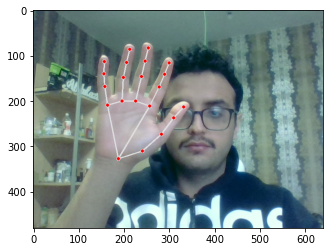

In [20]:
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

In [21]:
len(results.right_hand_landmarks.landmark)

21

In [22]:
#len(results.left_hand_landmarks.landmark)

In [23]:
mp_holistic.HAND_CONNECTIONS

frozenset({(0, 1),
           (0, 5),
           (0, 17),
           (1, 2),
           (2, 3),
           (3, 4),
           (5, 6),
           (5, 9),
           (6, 7),
           (7, 8),
           (9, 10),
           (9, 13),
           (10, 11),
           (11, 12),
           (13, 14),
           (13, 17),
           (14, 15),
           (15, 16),
           (17, 18),
           (18, 19),
           (19, 20)})

In [24]:
type(results.right_hand_landmarks)

mediapipe.framework.formats.landmark_pb2.NormalizedLandmarkList

In [25]:
#type(results.left_hand_landmarks.landmark)

## 3. Extract Keypoint Values

In [26]:
results.right_hand_landmarks.landmark[0].x

0.2938727140426636

In [27]:
rh = []
for res in results.right_hand_landmarks.landmark:
    test = np.array([res.x, res.y, res.z])
    rh.append(test)

In [28]:
rh

[array([2.93872714e-01, 6.81273758e-01, 4.81924985e-07]),
 array([ 0.37764987,  0.64790434, -0.02525539]),
 array([ 0.44256186,  0.57040966, -0.03117299]),
 array([ 0.48439693,  0.49448052, -0.03634308]),
 array([ 0.51983905,  0.44407108, -0.04181797]),
 array([ 0.401786  ,  0.44100899, -0.00823502]),
 array([ 0.43569112,  0.3527512 , -0.02584972]),
 array([ 0.45427752,  0.29446298, -0.04307889]),
 array([ 0.46887666,  0.24207011, -0.05654065]),
 array([ 0.35461929,  0.41674894, -0.01125582]),
 array([ 0.3738046 ,  0.30460048, -0.02719707]),
 array([ 0.38699621,  0.23412752, -0.04440656]),
 array([ 0.39800087,  0.17398062, -0.05743935]),
 array([ 0.3072474 ,  0.41736495, -0.0190768 ]),
 array([ 0.31205308,  0.30951947, -0.03812942]),
 array([ 0.32204473,  0.24022178, -0.05438345]),
 array([ 0.33418471,  0.1801942 , -0.06572345]),
 array([ 0.25762975,  0.43726504, -0.0296789 ]),
 array([ 0.24721831,  0.35130882, -0.05019091]),
 array([ 0.24432525,  0.29338008, -0.06137976]),
 array([ 0.

In [29]:
lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3)
rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() if results.right_hand_landmarks else np.zeros(21*3)

In [30]:
rh

array([ 2.93872714e-01,  6.81273758e-01,  4.81924985e-07,  3.77649873e-01,
        6.47904336e-01, -2.52553858e-02,  4.42561865e-01,  5.70409656e-01,
       -3.11729945e-02,  4.84396935e-01,  4.94480520e-01, -3.63430791e-02,
        5.19839048e-01,  4.44071084e-01, -4.18179743e-02,  4.01786000e-01,
        4.41008985e-01, -8.23501777e-03,  4.35691118e-01,  3.52751195e-01,
       -2.58497205e-02,  4.54277515e-01,  2.94462979e-01, -4.30788919e-02,
        4.68876660e-01,  2.42070109e-01, -5.65406531e-02,  3.54619294e-01,
        4.16748941e-01, -1.12558249e-02,  3.73804599e-01,  3.04600477e-01,
       -2.71970741e-02,  3.86996210e-01,  2.34127522e-01, -4.44065556e-02,
        3.98000866e-01,  1.73980623e-01, -5.74393496e-02,  3.07247400e-01,
        4.17364955e-01, -1.90768037e-02,  3.12053084e-01,  3.09519470e-01,
       -3.81294154e-02,  3.22044730e-01,  2.40221784e-01, -5.43834455e-02,
        3.34184706e-01,  1.80194199e-01, -6.57234490e-02,  2.57629752e-01,
        4.37265038e-01, -

In [31]:
lh

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [32]:
len(rh)

63

In [33]:
def extract_keypoints(results):
    
    lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3)
    rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() if results.right_hand_landmarks else np.zeros(21*3)
    return np.concatenate([ lh, rh])

In [34]:
result_test = extract_keypoints(results)

In [35]:
result_test

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  

In [36]:
(21*3) + (21*3)  # right & lift hands have 21 landmarks multbly by 3 coordinate values each

126

In [37]:
np.save('0', result_test)

In [38]:
np.load('0.npy')

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  

## 4. Setup Folders for Collection

In [45]:
# Path for exported data, numpy arrays
DATA_PATH = os.path.join('MP_Data') 

# Actions that we try to detect
actions = np.array(['ThankYou','Please come here','Play','phone','painful','More','I wish you a good Life',
                    'I want to talk','I love you','I am good','HI','help','goodbye','Good job','Food','Finished'
                   ])

# Thirty videos worth of data
no_sequences = 30

# Videos are going to be 30 frames in length
sequence_length = 30
start_folder = 30

In [46]:
for action in actions: 
    for sequence in range(no_sequences):
        try: 
            os.makedirs(os.path.join(DATA_PATH, action, str(sequence)))
        except:
            pass

## 5. Collect Keypoint Values for Training and Testing

In [ ]:
cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    
    # NEW LOOP
    # Loop through actions
    for action in actions:
        # Loop through sequences aka videos
        for sequence in range(no_sequences):
            # Loop through video length aka sequence length
            for frame_num in range(sequence_length):

                # Read feed
                ret, frame = cap.read()

                # Make detections
                image, results = mediapipe_detection(frame, holistic)
                print(results)

                # Draw landmarks
                draw_styled_landmarks(image, results)
                
                # NEW Apply wait logic
                if frame_num == 0: 
                    cv2.putText(image, 'STARTING COLLECTION', (120,200), 
                               cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255, 0), 4, cv2.LINE_AA)
                    cv2.putText(image, 'Collecting frames for {} Video Number {}'.format(action, sequence), (15,12), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
                    # Show to screen
                    cv2.imshow('OpenCV Feed', image)
                    cv2.waitKey(2000)
                else: 
                    cv2.putText(image, 'Collecting frames for {} Video Number {}'.format(action, sequence), (15,12), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
                    # Show to screen
                    cv2.imshow('OpenCV Feed', image)
                
                # NEW Export keypoints
                keypoints = extract_keypoints(results)
                npy_path = os.path.join(DATA_PATH, action, str(sequence), str(frame_num))
                np.save(npy_path, keypoints)

                # Break gracefully
                if cv2.waitKey(10) & 0xFF == ord('q'):
                    break
                    
    cap.release()
    cv2.destroyAllWindows()

In [35]:
cap.release()
cv2.destroyAllWindows()

## 6. Preprocess Data and Create Labels and Features

In [41]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [48]:
label_map = {label:num for num, label in enumerate(actions)}   # create a label map to represent each on of our different action

In [49]:
label_map

{'ThankYou': 0,
 'Please come here': 1,
 'Play': 2,
 'phone': 3,
 'painful': 4,
 'More': 5,
 'I wish you a good Life': 6,
 'I want to talk': 7,
 'I love you': 8,
 'I am good': 9,
 'HI': 10,
 'help': 11,
 'goodbye': 12,
 'Good job': 13,
 'Food': 14,
 'Finished': 15}

In [50]:
sequences, labels = [], []
for action in actions:
    for sequence in range(no_sequences):
        window = []
        for frame_num in range(sequence_length):
            res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])

In [51]:
(21*3) + (21*3)  # right & lift hands have 21 landmarks multbly by 3 coordinate values each

126

In [52]:
np.array(sequences).shape

(480, 30, 126)

In [53]:
np.array(labels).shape

(480,)

In [54]:
X = np.array(sequences)

In [55]:
X.shape

(480, 30, 126)

In [56]:
X

array([[[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          4.07058775e-01,  7.94471622e-01, -4.50515524e-02],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          4.01963770e-01,  7.98717439e-01, -4.99601588e-02],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          4.02421325e-01,  7.96545863e-01, -5.00969216e-02],
        ...,
        [ 6.92228734e-01,  9.57727790e-01,  6.89375099e-08, ...,
          5.30899286e-01,  7.31085837e-01, -3.39794941e-02],
        [ 6.91380680e-01,  9.61026490e-01,  6.87869743e-08, ...,
          5.31963587e-01,  7.19644070e-01, -3.83037403e-02],
        [ 6.90477133e-01,  9.61394370e-01,  7.50902274e-08, ...,
          5.26359439e-01,  7.32278764e-01, -3.67730446e-02]],

       [[ 6.90851033e-01,  9.61393952e-01,  8.25030071e-08, ...,
          5.31979322e-01,  7.29273260e-01, -4.93059754e-02],
        [ 7.35343695e-01,  1.01441741e+00,  8.21222770e-08, ...,
          0.00000000e+00,  0.00000000e

In [57]:
y = to_categorical(labels).astype(int)

In [58]:
y

array([[1, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1]])

In [59]:
from sklearn.model_selection import train_test_split


In [50]:
# X, X_val, Y, Y_val  = train_test_split(X, y, test_size=0.05)

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.04)

In [79]:
#validation_data=(X_val, y_val)

In [80]:
X_train.shape

(460, 30, 126)

In [81]:
X_test.shape

(20, 30, 126)

In [82]:
y_train.shape

(460, 16)

In [83]:
y_test.shape

(20, 16)

In [84]:
X.shape

(480, 30, 126)

In [58]:
X

array([[[ 0.        ,  0.        ,  0.        , ...,  0.3081992 ,
          0.50233811, -0.05838833],
        [ 0.        ,  0.        ,  0.        , ...,  0.33580858,
          0.46109873, -0.06320657],
        [ 0.        ,  0.        ,  0.        , ...,  0.33864975,
          0.45898443, -0.06530134],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.34194118,
          0.45873863, -0.06015209],
        [ 0.        ,  0.        ,  0.        , ...,  0.34465927,
          0.45687798, -0.06067167],
        [ 0.        ,  0.        ,  0.        , ...,  0.34601739,
          0.45701897, -0.06139719]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.3469421 ,
          0.45719168, -0.06087984],
        [ 0.        ,  0.        ,  0.        , ...,  0.33181706,
          0.45753551, -0.0663669 ],
        [ 0.        ,  0.        ,  0.        , ...,  0.32937017,
          0.4589501 , -0.0650432 ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  

## Build and Train LSTM Neural Network

In [66]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import TensorBoard

In [67]:
import os

In [68]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [70]:
model = Sequential()
model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(30,126)))
model.add(LSTM(128, return_sequences=True, activation='relu'))
model.add(LSTM(64, return_sequences=False, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(actions.shape[0], activation='softmax'))


In [89]:
model.compile(optimizer='sgd', loss='mse')
  # This builds the model for the first time:
model.fit(X, y, batch_size=256, epochs=2000)

Epoch 1/2000
2/2 [==============================] - 7s 227ms/step - loss: 0.0026
Epoch 2/2000
2/2 [==============================] - 1s 228ms/step - loss: 0.0019
Epoch 3/2000
2/2 [==============================] - 0s 212ms/step - loss: 0.0019
Epoch 4/2000
2/2 [==============================] - 0s 220ms/step - loss: 0.0018
Epoch 5/2000
2/2 [==============================] - 0s 213ms/step - loss: 0.0018
Epoch 6/2000
2/2 [==============================] - 0s 215ms/step - loss: 0.0017
Epoch 7/2000
2/2 [==============================] - 0s 209ms/step - loss: 0.0015
Epoch 8/2000
2/2 [==============================] - 0s 209ms/step - loss: 0.0014
Epoch 9/2000
2/2 [==============================] - 0s 217ms/step - loss: 0.0017
Epoch 10/2000
2/2 [==============================] - 0s 215ms/step - loss: 0.0015 0s - loss: 0.001
Epoch 11/2000
2/2 [==============================] - 0s 224ms/step - loss: 0.0012
Epoch 12/2000
2/2 [==============================] - 0s 216ms/step - loss: 0.0014
Epoch 13

2/2 [==============================] - 0s 212ms/step - loss: 0.0012
Epoch 101/2000
2/2 [==============================] - 0s 235ms/step - loss: 0.0012
Epoch 102/2000
2/2 [==============================] - 0s 204ms/step - loss: 0.0013
Epoch 103/2000
2/2 [==============================] - 0s 208ms/step - loss: 0.0012
Epoch 104/2000
2/2 [==============================] - 0s 218ms/step - loss: 0.0011
Epoch 105/2000
2/2 [==============================] - 0s 213ms/step - loss: 0.0012
Epoch 106/2000
2/2 [==============================] - 0s 219ms/step - loss: 0.0010
Epoch 107/2000
2/2 [==============================] - 0s 206ms/step - loss: 9.4260e-04
Epoch 108/2000
2/2 [==============================] - 0s 220ms/step - loss: 0.0011
Epoch 109/2000
2/2 [==============================] - 0s 206ms/step - loss: 0.0011
Epoch 110/2000
2/2 [==============================] - 0s 211ms/step - loss: 9.3182e-04
Epoch 111/2000
2/2 [==============================] - 0s 207ms/step - loss: 0.0012
Epoch 112/2

KeyboardInterrupt: 

In [72]:
Model: "sequential_4"

In [73]:
res = [0.7, 0.2, 0.1]

In [74]:
[actions.shape[0]]

[16]

In [75]:
actions[np.argmax(res)]

'ThankYou'

In [85]:
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [86]:
model.fit(X_train, y_train,batch_size=256, epochs=100, callbacks=[tb_callback])

Epoch 1/100
2/2 [==============================] - 16s 9s/step - loss: 1.2712 - categorical_accuracy: 0.6438
Epoch 2/100
2/2 [==============================] - 0s 222ms/step - loss: 2.3543 - categorical_accuracy: 0.5359
Epoch 3/100
2/2 [==============================] - 0s 193ms/step - loss: 1.5553 - categorical_accuracy: 0.4857
Epoch 4/100
2/2 [==============================] - 1s 185ms/step - loss: 1.3835 - categorical_accuracy: 0.5432
Epoch 5/100
2/2 [==============================] - 1s 200ms/step - loss: 1.3281 - categorical_accuracy: 0.5986
Epoch 6/100
2/2 [==============================] - 1s 192ms/step - loss: 1.1530 - categorical_accuracy: 0.6010
Epoch 7/100
2/2 [==============================] - 1s 196ms/step - loss: 1.0780 - categorical_accuracy: 0.6571
Epoch 8/100
2/2 [==============================] - 1s 184ms/step - loss: 1.0007 - categorical_accuracy: 0.5485
Epoch 9/100
2/2 [==============================] - 1s 210ms/step - loss: 0.9064 - categorical_accuracy: 0.6296
Epo

2/2 [==============================] - 1s 191ms/step - loss: 0.2769 - categorical_accuracy: 0.9089
Epoch 74/100
2/2 [==============================] - 1s 196ms/step - loss: 0.3314 - categorical_accuracy: 0.8979
Epoch 75/100
2/2 [==============================] - 1s 188ms/step - loss: 0.2703 - categorical_accuracy: 0.9022
Epoch 76/100
2/2 [==============================] - 1s 209ms/step - loss: 0.2244 - categorical_accuracy: 0.9244
Epoch 77/100
2/2 [==============================] - 0s 186ms/step - loss: 0.2379 - categorical_accuracy: 0.9064
Epoch 78/100
2/2 [==============================] - 0s 207ms/step - loss: 0.2097 - categorical_accuracy: 0.9187
Epoch 79/100
2/2 [==============================] - 1s 198ms/step - loss: 0.2027 - categorical_accuracy: 0.9450
Epoch 80/100
2/2 [==============================] - 0s 211ms/step - loss: 0.2252 - categorical_accuracy: 0.9158
Epoch 81/100
2/2 [==============================] - 0s 192ms/step - loss: 0.2138 - categorical_accuracy: 0.9095
Epoch

In [71]:
#model.fit(X_train, y_train,batch_size=32, epochs=128, callbacks=[tb_callback])

In [87]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 30, 64)            48896     
_________________________________________________________________
lstm_1 (LSTM)                (None, 30, 128)           98816     
_________________________________________________________________
lstm_2 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense (Dense)                (None, 64)                4160      
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 16)                528       
Total params: 203,888
Trainable params: 203,888
Non-trainable params: 0
__________________________________________________

plt.plot(np.array(df['10 Year sin'])[:365])
plt.plot(np.array(df['10 Year cos'])[:365])
plt.xlabel('Time [Day]')
plt.title('Time of 10 Year signal')

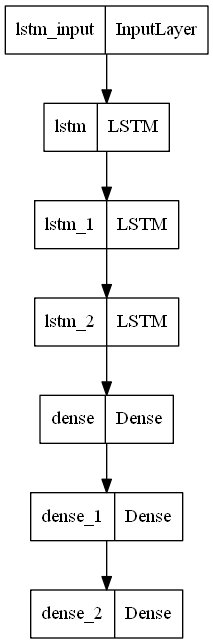

In [74]:
plot_model(model)

In [76]:
def visualize_model(model):
    return SVG(model_to_dot(model).create(prog='dot', format='svg' ))

In [77]:
#model??

In [78]:
from keras.models import Sequential

In [79]:
#Sequential??

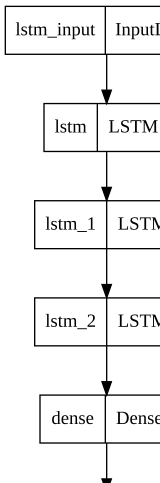

In [80]:
import keras
import pydot as pyd
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

keras.utils.vis_utils.pydot = pyd

#Visualize Model

def visualize_model(model):
    return SVG(model_to_dot(model).create(prog='dot', format='svg' ))
#create your model
#then call the function on your model
visualize_model(model)

In [81]:
len(model.weights)

15

In [82]:
plt.show('action.h5')

In [83]:
len('action.h5')

9

## Make Predictions

In [84]:
res = model.predict(X_test)

In [85]:
actions[np.argmax(res[0])]

'I am Fine'

In [86]:
actions[np.argmax(y_test[5])]

'Thank you'

## Save Weights

In [87]:
model.save('action.h5')

In [88]:
model.load_weights('action.h5')

## Evaluation using Confusion Matrix and Accuracy

In [89]:
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score

In [90]:
yhat = model.predict(X_test)

In [91]:
ytrue = np.argmax(y_test, axis=1).tolist()
yhat = np.argmax(yhat, axis=1).tolist()

In [92]:
multilabel_confusion_matrix(ytrue, yhat)

array([[[36,  0],
        [ 0,  9]],

       [[34,  0],
        [ 1, 10]],

       [[38,  0],
        [ 0,  7]],

       [[40,  0],
        [ 0,  5]],

       [[40,  0],
        [ 0,  5]],

       [[36,  1],
        [ 0,  8]]], dtype=int64)

In [93]:
accuracy_score(ytrue, yhat)

0.9777777777777777

In [94]:
X_train.shape

(135, 30, 126)

## Test in Real Time

In [96]:
sequence

29

In [105]:
# 1. New detection variables
sequence = []  # collect 30 frames to generate predection
sentence = [] # concadenate history of detections
threshold = 0.66 # only running result if it above  the threshold

cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():

        # Read feed
        ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
       # print(results)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)
        
        # 2. Prediction logic
        keypoints = extract_keypoints(results)

        sequence.append(keypoints)
        sequence = sequence[-30:]
        
        if len(sequence) == 30:
            res = model.predict(np.expand_dims(sequence, axis=0))[0]
           # print(actions[np.argmax(res)])
            
            
        #3. Viz logic
            if res[np.argmax(res)] > threshold: 
                if len(sentence) > 0: 
                    if actions[np.argmax(res)] != sentence[-1]:
                        sentence.append(actions[np.argmax(res)])
                else:
                    sentence.append(actions[np.argmax(res)])

            if len(sentence) > 1: 
                sentence = sentence[-1:]

            
        cv2.rectangle(image, (0,0), (640, 40), (245, 117, 16), -1)
        cv2.putText(image, ' '.join(sentence), (3,30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
        
        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows()

In [106]:
cap.release()
cv2.destroyAllWindows()

In [107]:
sequence.reverse()

In [108]:
sequence.append('def')

In [109]:
res[np.argmax(res)] > threshold

False

In [110]:
(sequences,30,126)

([[array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.

In [111]:
model.predict(np.expand_dims(X_test[0], axis=0))

array([[1.000000e+00, 0.000000e+00, 2.753176e-10, 0.000000e+00,
        0.000000e+00, 0.000000e+00]], dtype=float32)

In [112]:
sequence[-30:]

[array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.0